In [2]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import os
import time
from PIL import Image

In [3]:
from tqdm import tqdm
import lpips
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

lpips_alex = lpips.LPIPS().cuda().eval()

KeyboardInterrupt: 

In [ ]:
# -----------------------
# Helpers: AdaIN layers
# -----------------------
def calc_mean_std(feat, eps=1e-5):
    # feat: (B, C, H, W)
    size = feat.size()
    N, C = size[:2]
    feat_var = feat.view(N, C, -1).var(dim=2, unbiased=False) + eps
    feat_std = feat_var.sqrt().view(N, C, 1, 1)
    feat_mean = feat.view(N, C, -1).mean(dim=2).view(N, C, 1, 1)
    return feat_mean, feat_std


class AdaIN(nn.Module):
    """
    Adaptive Instance Normalization applied to feature maps.
    gamma and beta are expected of shape (B, C) or (B, C, 1, 1).
    """
    def __init__(self, eps=1e-5):
        super().__init__()
        self.eps = eps

    def forward(self, x, gamma, beta):
        # x: (B,C,H,W); gamma/beta: (B, C) or (B,C,1,1)
        b, c, h, w = x.size()
        mean, std = calc_mean_std(x, eps=self.eps)
        normalized = (x - mean) / std
        if gamma.dim() == 2:
            gamma = gamma.view(b, c, 1, 1)
            beta  = beta.view(b, c, 1, 1)
        return normalized * gamma + beta

In [ ]:
# -----------------------
# Basic blocks
# -----------------------
def conv_block(in_ch, out_ch, kernel=3, stride=1, padding=1, norm='in', activation='relu'):
    layers = []
    layers.append(nn.Conv2d(in_ch, out_ch, kernel, stride, padding))
    if norm == 'in':
        layers.append(nn.InstanceNorm2d(out_ch))
    elif norm == 'bn':
        layers.append(nn.BatchNorm2d(out_ch))
    if activation == 'relu':
        layers.append(nn.ReLU(inplace=True))
    elif activation == 'lrelu':
        layers.append(nn.LeakyReLU(0.2, inplace=True))
    return nn.Sequential(*layers)


class ResBlockAdaIN(nn.Module):
    """
    Residual block with AdaIN inside. The AdaIN parameters (gamma, beta) are
    provided per residual block (from MLP derived from style-code).
    We'll expect gamma/beta per block concatenated, so this block receives
    a slice of gamma/beta vectors.
    """
    def __init__(self, channels):
        super().__init__()
        self.conv1 = nn.Conv2d(channels, channels, 3, 1, 1)
        self.conv2 = nn.Conv2d(channels, channels, 3, 1, 1)
        self.act = nn.ReLU(inplace=True)
        self.adain = AdaIN()

    def forward(self, x, gamma1, beta1, gamma2, beta2):
        out = self.conv1(x)
        out = self.adain(out, gamma1, beta1)
        out = self.act(out)
        out = self.conv2(out)
        out = self.adain(out, gamma2, beta2)
        return x + out  # residual

In [ ]:
# -----------------------
# Encoders / Decoder
# -----------------------
class ContentEncoder(nn.Module):
    """
    Content encoder: c7s1-64, d128, d256, R256 x4
    Uses InstanceNorm on conv layers as in paper.
    Output: content feature map (B, Cc, H/4, W/4).
    """
    def __init__(self, in_ch=3, dim=64, n_down=2, n_res=4):
        super().__init__()
        layers = []
        # c7s1-64
        layers.append(nn.Conv2d(in_ch, dim, 7, 1, 3))
        layers.append(nn.InstanceNorm2d(dim))
        layers.append(nn.ReLU(inplace=True))
        # downsampling
        cur_dim = dim
        for i in range(n_down):
            layers.append(nn.Conv2d(cur_dim, cur_dim*2, 4, 2, 1))
            layers.append(nn.InstanceNorm2d(cur_dim*2))
            layers.append(nn.ReLU(inplace=True))
            cur_dim *= 2
        # residual blocks
        self.model = nn.Sequential(*layers)
        self.resblocks = nn.ModuleList([self._make_resblock(cur_dim) for _ in range(n_res)])
        self.out_dim = cur_dim

    def _make_resblock(self, channels):
        blk = nn.Sequential(
            nn.Conv2d(channels, channels, 3, 1, 1),
            nn.InstanceNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, 3, 1, 1),
            nn.InstanceNorm2d(channels),
        )
        return blk

    def forward(self, x):
        x = self.model(x)
        for blk in self.resblocks:
            residual = x
            x = blk(x) + residual
        return x  # content feature map


class StyleEncoder(nn.Module):
    """
    Probabilistic style encoder (VAE): c7s1-64, d128, d256, d256, d256, GAP, fc_mu/fc_logvar.
    Per paper: no normalization in style encoder; returns mu, logvar, and a reparameterized sample.
    """
    def __init__(self, in_ch=3, dim=64, style_dim=8):
        super().__init__()
        layers = []
        layers.append(nn.Conv2d(in_ch, dim, 7, 1, 3))
        layers.append(nn.ReLU(inplace=True))
        cur_dim = dim
        # stride-2 conv stack
        for out_dim in [128, 256, 256, 256]:
            layers.append(nn.Conv2d(cur_dim, out_dim, 4, 2, 1))
            layers.append(nn.ReLU(inplace=True))
            cur_dim = out_dim
        self.conv = nn.Sequential(*layers)
        self.gap = nn.AdaptiveAvgPool2d(1)
        self.fc_mu = nn.Linear(cur_dim, style_dim)
        self.fc_logvar = nn.Linear(cur_dim, style_dim)

    def forward(self, x):
        x = self.conv(x)
        x = self.gap(x).view(x.size(0), -1)
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std
        return z, mu, logvar  # sample, mean, log variance


class MLP(nn.Module):
    """
    MLP that maps style vector to AdaIN params (gamma/beta) for all residual blocks.
    For each ResBlockAdaIN we need 2 conv layers' gamma+beta (per channel).
    We'll compute required number of params based on number of res blocks and channel dim.
    """
    def __init__(self, in_dim, out_dim, hidden=256):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden),
            nn.ReLU(inplace=True),
            nn.Linear(hidden, hidden),
            nn.ReLU(inplace=True),
            nn.Linear(hidden, out_dim)
        )

    def forward(self, x):
        return self.net(x)


class Decoder(nn.Module):
    """
    Decoder: residual blocks with AdaIN, then upsampling u128, u64, c7s1-3.
    We'll expect content feature map and style vector -> MLP to AdaIN params.
    """
    def __init__(self, out_ch=3, dim=256, n_res=4):
        super().__init__()
        self.n_res = n_res
        self.dim = dim
        # Residual blocks with AdaIN (we'll instantiate them)
        self.resblocks = nn.ModuleList([ResBlockAdaIN(dim) for _ in range(n_res)])
        # upsampling layers
        self.upsample1 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(dim, dim//2, 5, 1, 2),
            nn.InstanceNorm2d(dim//2),
            nn.ReLU(inplace=True)
        )
        self.upsample2 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(dim//2, dim//4, 5, 1, 2),
            nn.InstanceNorm2d(dim//4),
            nn.ReLU(inplace=True)
        )
        self.final = nn.Conv2d(dim//4, out_ch, 7, 1, 3)
        # AdaIN does not have built-in params: MLP generates them (see training code)
        self.adain = AdaIN()

    def forward(self, content_feat, adain_params):
        """
        content_feat: (B, C=dim, H, W)
        adain_params: vector shaped (B, total_params)
            we will slice it into gamma/beta pairs for each conv in each resblock
            Each ResBlockAdaIN uses two convs, each needs gamma & beta (dim)
            So per resblock: 2 * dim (gamma) + 2 * dim (beta) = 4*dim? Wait: each conv needs gamma,beta per channel.
            For simplicity, we produce 4*dim values per resblock: gamma1,beta1,gamma2,beta2.
        """
        b = content_feat.size(0)
        # reshape adain_params -> (B, n_res, 4, dim)
        expected = self.n_res * 4 * self.dim
        assert adain_params.size(1) == expected, f"expected {expected} params, got {adain_params.size(1)}"
        p = adain_params.view(b, self.n_res, 4, self.dim)
        x = content_feat
        for i, rb in enumerate(self.resblocks):
            gamma1 = p[:, i, 0, :]
            beta1  = p[:, i, 1, :]
            gamma2 = p[:, i, 2, :]
            beta2  = p[:, i, 3, :]
            # pass through block (block itself applies convs; it expects gamma/beta per conv)
            x = rb(x, gamma1, beta1, gamma2, beta2)
        x = self.upsample1(x)
        x = self.upsample2(x)
        x = self.final(x)
        x = torch.tanh(x)  # outputs in [-1,1]
        return x

In [ ]:
# -----------------------
# Discriminator (PatchGAN)
# -----------------------
class NLayerDiscriminator(nn.Module):
    """
    Simple PatchGAN discriminator (can be used for multi-scale by instantiating multiple of these on scaled images).
    d64, d128, d256, d512 (as in appendix).
    """
    def __init__(self, in_ch=3, ndf=64, n_layers=4):
        super().__init__()
        kw = 4
        padw = 1
        sequence = [
            nn.Conv2d(in_ch, ndf, kw, 2, padw),
            nn.LeakyReLU(0.2, True)
        ]
        nf = ndf
        for n in range(1, n_layers):
            nf_prev = nf
            nf = min(nf_prev*2, 512)
            stride = 1 if n == n_layers-1 else 2
            sequence += [
                nn.Conv2d(nf_prev, nf, kw, stride, padw),
                nn.InstanceNorm2d(nf),
                nn.LeakyReLU(0.2, True)
            ]
        sequence += [nn.Conv2d(nf, 1, kw, 1, padw)]  # output 1-channel patch
        self.model = nn.Sequential(*sequence)

    def forward(self, x):
        return self.model(x)

In [ ]:
# Multi-scale discriminator wrapper (two scales as in MUNIT)
class MultiScaleDiscriminator(nn.Module):
    def __init__(self, in_ch=3, ndf=64, n_layers=4, num_scales=2):
        super().__init__()
        self.discriminators = nn.ModuleList([
            NLayerDiscriminator(in_ch, ndf, n_layers) for _ in range(num_scales)
        ])
        self.downsample = nn.AvgPool2d(3, stride=2, padding=1, count_include_pad=False)

    def forward(self, x):
        outputs = []
        cur = x
        for d in self.discriminators:
            outputs.append(d(cur))
            cur = self.downsample(cur)
        return outputs


In [ ]:
# -----------------------
# MUNIT model wrapper
# -----------------------
class MUNITModel:
    def __init__(self, device='cuda', weight_decay=1e-4, lambda_kl=0.01):
        self.device = device
        self.style_dim = 8
        self.n_res = 4
        base_dim = 64
        enc_dim = base_dim * 4  # after d,d (64->128->256)
        # domain A networks
        self.Ec_A = ContentEncoder(in_ch=3, dim=64, n_down=2, n_res=self.n_res).to(device)
        self.Es_A = StyleEncoder(in_ch=3, dim=64, style_dim=self.style_dim).to(device)
        # domain B networks
        self.Ec_B = ContentEncoder(in_ch=3, dim=64, n_down=2, n_res=self.n_res).to(device)
        self.Es_B = StyleEncoder(in_ch=3, dim=64, style_dim=self.style_dim).to(device)
        # decoders
        self.G_A = Decoder(out_ch=3, dim=256, n_res=self.n_res).to(device)
        self.G_B = Decoder(out_ch=3, dim=256, n_res=self.n_res).to(device)
        # MLPs that map style code -> AdaIN params for decoder residual blocks
        # total AdaIN params per decoder: n_res * 4 * dim (see Decoder.forward)
        total_adain_params = self.n_res * 4 * 256
        self.MLP_A = MLP(self.style_dim, total_adain_params).to(device)
        self.MLP_B = MLP(self.style_dim, total_adain_params).to(device)
        # discriminators: two-scale PatchGANs per paper
        self.D_A = MultiScaleDiscriminator(in_ch=3).to(device)
        self.D_B = MultiScaleDiscriminator(in_ch=3).to(device)

        # optimizers (with weight decay)
        params_G = list(self.Ec_A.parameters()) + list(self.Es_A.parameters()) + \
                   list(self.Ec_B.parameters()) + list(self.Es_B.parameters()) + \
                   list(self.G_A.parameters()) + list(self.G_B.parameters()) + \
                   list(self.MLP_A.parameters()) + list(self.MLP_B.parameters())
        params_D = list(self.D_A.parameters()) + list(self.D_B.parameters())
        self.opt_G = torch.optim.Adam(params_G, lr=1e-4, betas=(0.5, 0.999), weight_decay=weight_decay)
        self.opt_D = torch.optim.Adam(params_D, lr=1e-4, betas=(0.5, 0.999), weight_decay=weight_decay)

        # loss weights per paper
        self.lambda_x = 10.0
        self.lambda_c = 1.0
        self.lambda_s = 1.0
        self.lambda_kl = lambda_kl

        # adversarial loss: LSGAN (MSE loss)
        self.mse = nn.MSELoss()
        # image L1 reconstruction
        self.l1 = nn.L1Loss()

    def sample_style(self, batch_size, device):
        # prior q(s) ~ N(0, I)
        return torch.randn(batch_size, self.style_dim, device=device)

    def kl_loss(self, mu, logvar):
        return 0.5 * torch.mean(torch.exp(logvar) + mu * mu - 1. - logvar)

    def _disc_loss(self, preds_real, preds_fake):
        loss = 0.0
        for pr, pf in zip(preds_real, preds_fake):
            loss += 0.5 * (self.mse(pr, torch.ones_like(pr)) + self.mse(pf, torch.zeros_like(pf)))
        return loss / len(preds_real)

    def _gan_loss_G(self, preds_fake):
        loss = 0.0
        for pf in preds_fake:
            loss += 0.5 * self.mse(pf, torch.ones_like(pf))
        return loss / len(preds_fake)

    def discriminator_step(self, real_A, real_B):
        """
        Update discriminators to distinguish real images and translated ones.
        """
        device = self.device
        self.D_A.train(); self.D_B.train()
        self.opt_D.zero_grad()

        # translate A->B and B->A (sample random style)
        with torch.no_grad():
            cA = self.Ec_A(real_A)
            sB_rand = self.sample_style(real_A.size(0), device)
            adain_B = self.MLP_B(sB_rand)
            fake_B = self.G_B(cA, adain_B)

            cB = self.Ec_B(real_B)
            sA_rand = self.sample_style(real_B.size(0), device)
            adain_A = self.MLP_A(sA_rand)
            fake_A = self.G_A(cB, adain_A)

        # D_B loss: real -> 1, fake -> 0 (LSGAN)
        pred_real_B = self.D_B(real_B)
        pred_fake_B = self.D_B(fake_B.detach())
        loss_DB = self._disc_loss(pred_real_B, pred_fake_B)

        # D_A loss
        pred_real_A = self.D_A(real_A)
        pred_fake_A = self.D_A(fake_A.detach())
        loss_DA = self._disc_loss(pred_real_A, pred_fake_A)

        loss_D = loss_DA + loss_DB
        loss_D.backward()
        self.opt_D.step()
        return loss_D.item()

    def generator_step(self, real_A, real_B):
        """
        Update encoders + decoders to minimize GAN + reconstruction losses.
        Implements bidirectional reconstruction and latent reconstruction.
        """
        device = self.device
        self.opt_G.zero_grad()

        # ---------- encode real images ----------
        cA = self.Ec_A(real_A)       # content map
        sA, muA, logvarA = self.Es_A(real_A)
        cB = self.Ec_B(real_B)
        sB, muB, logvarB = self.Es_B(real_B)

        # ---------- within-domain reconstruction x -> E -> G -> x̂ ----------
        adain_A_from_sA = self.MLP_A(sA)
        rec_A = self.G_A(cA, adain_A_from_sA)
        adain_B_from_sB = self.MLP_B(sB)
        rec_B = self.G_B(cB, adain_B_from_sB)

        loss_recon_xA = self.l1(rec_A, real_A)
        loss_recon_xB = self.l1(rec_B, real_B)

        # ---------- cross-domain translation (sample random style) ----------
        sB_rand = self.sample_style(real_A.size(0), device)
        adain_B_rand = self.MLP_B(sB_rand)
        fake_B = self.G_B(cA, adain_B_rand)

        sA_rand = self.sample_style(real_B.size(0), device)
        adain_A_rand = self.MLP_A(sA_rand)
        fake_A = self.G_A(cB, adain_A_rand)

        # ---------- adversarial losses on translated images ----------
        pred_fake_B = self.D_B(fake_B)
        pred_fake_A = self.D_A(fake_A)
        loss_GAN_B = self._gan_loss_G(pred_fake_B)
        loss_GAN_A = self._gan_loss_G(pred_fake_A)

        # ---------- latent reconstruction:
        # encode fake_B -> recover content and style codes and compare to originals ----------
        # content reconstruction: Ec_B(fake_B) should match cA
        cA_rec = self.Ec_B(fake_B)
        loss_rec_cA = self.l1(cA_rec, cA.detach())  # paper uses Ec2(G2(c1,s2)) -> c1

        # style reconstruction: Es_B(fake_B) should match sB_rand
        sB_rec, _, _ = self.Es_B(fake_B)
        loss_rec_sB = self.l1(sB_rec, sB_rand.detach())

        # similarly for other direction
        cB_rec = self.Ec_A(fake_A)
        loss_rec_cB = self.l1(cB_rec, cB.detach())
        sA_rec, _, _ = self.Es_A(fake_A)
        loss_rec_sA = self.l1(sA_rec, sA_rand.detach())

        # ---------- KL losses on real style codes ----------
        kl_A = self.kl_loss(muA, logvarA)
        kl_B = self.kl_loss(muB, logvarB)

        # ---------- total loss ----------
        loss_recon_x = loss_recon_xA + loss_recon_xB
        loss_rec_c = loss_rec_cA + loss_rec_cB
        loss_rec_s = loss_rec_sA + loss_rec_sB
        loss_gan = loss_GAN_A + loss_GAN_B
        loss_kl = kl_A + kl_B

        loss_G = loss_gan + self.lambda_x * loss_recon_x + self.lambda_c * loss_rec_c + self.lambda_s * loss_rec_s + self.lambda_kl * loss_kl

        loss_G.backward()
        self.opt_G.step()

        # return scalar losses for monitoring
        return {
            'loss_G': loss_G.item(),
            'loss_gan': loss_gan.item(),
            'loss_recon_x': loss_recon_x.item(),
            'loss_rec_c': loss_rec_c.item(),
            'loss_rec_s': loss_rec_s.item(),
            'loss_kl': loss_kl.item()
        }

In [ ]:
# UTILS: save images and checkpoints
from torchvision.utils import save_image

def save_sample(real_A, out_B, step, prefix="samples"):
    os.makedirs(prefix, exist_ok=True)
    img = torch.cat([real_A, out_B], dim=3)  # concat horizontally
    save_path = os.path.join(prefix, f"iter_{step}.jpg")
    save_image((img * 0.5 + 0.5), save_path)
    print(f"[+] Saved sample → {save_path}")


def save_latest(real_A, out_B, prefix="samples"):
    os.makedirs(prefix, exist_ok=True)
    img = torch.cat([real_A, out_B], dim=3)
    save_path = os.path.join(prefix, f"latest.jpg")
    save_image((img * 0.5 + 0.5), save_path)


def save_checkpoint(model, step, prefix="checkpoints", extra=None):
    os.makedirs(prefix, exist_ok=True)
    path = os.path.join(prefix, f"munit_{step}.pth")
    payload = {
        "step": step,
        "Ec_A": model.Ec_A.state_dict(),
        "Es_A": model.Es_A.state_dict(),
        "Ec_B": model.Ec_B.state_dict(),
        "Es_B": model.Es_B.state_dict(),
        "G_A": model.G_A.state_dict(),
        "G_B": model.G_B.state_dict(),
        "MLP_A": model.MLP_A.state_dict(),
        "MLP_B": model.MLP_B.state_dict(),
        "D_A": model.D_A.state_dict(),
        "D_B": model.D_B.state_dict(),
        "opt_G": model.opt_G.state_dict(),
        "opt_D": model.opt_D.state_dict(),
    }
    if extra:
        payload.update(extra)
    torch.save(payload, path)
    print(f"[+] Checkpoint saved → {path}")


def load_checkpoint(model, path, map_location=None):
    ckpt = torch.load(path, map_location=map_location)
    model.Ec_A.load_state_dict(ckpt["Ec_A"])
    model.Es_A.load_state_dict(ckpt["Es_A"])
    model.Ec_B.load_state_dict(ckpt["Ec_B"])
    model.Es_B.load_state_dict(ckpt["Es_B"])
    model.G_A.load_state_dict(ckpt["G_A"])
    model.G_B.load_state_dict(ckpt["G_B"])
    model.MLP_A.load_state_dict(ckpt["MLP_A"])
    model.MLP_B.load_state_dict(ckpt["MLP_B"])
    model.D_A.load_state_dict(ckpt["D_A"])
    model.D_B.load_state_dict(ckpt["D_B"])
    if "opt_G" in ckpt:
        model.opt_G.load_state_dict(ckpt["opt_G"])
    if "opt_D" in ckpt:
        model.opt_D.load_state_dict(ckpt["opt_D"])
    return ckpt.get("step", 0)


# visualize grid directly in notebook
def show_grid(tensor, title=""):
    """
    tensor: BCHW in [-1,1]
    """
    grid = make_grid((tensor * 0.5 + 0.5).clamp(0,1))
    npimg = grid.permute(1,2,0).cpu().numpy()
    plt.figure(figsize=(10,10))
    plt.imshow(npimg)
    plt.axis("off")
    if title:
        plt.title(title)
    plt.show()


In [ ]:
# -----------------------
# Dataset loader (simple folder-based)
# -----------------------
class ImageFolderDataset(Dataset):
    """
    Expects folder with images. Transforms: resize/crop -> to tensor [-1,1]
    """
    def __init__(self, root, size=256, mode='train'):
        super().__init__()
        self.paths = [os.path.join(root, p) for p in sorted(os.listdir(root))]
        self.size = size
        self.transform = transforms.Compose([
            transforms.Resize(int(size * 286 / 256)),  # as in paper: resize to 286
            transforms.RandomCrop(size),
            transforms.RandomHorizontalFlip(),
            transforms.ColorJitter(0.1, 0.1, 0.1, 0.05),
            transforms.ToTensor(),  # [0,1]
            transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))  # [-1,1]
        ])

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        p = self.paths[idx]
        img = Image.open(p).convert('RGB')
        return self.transform(img)

# -----------------------
# Training loop example
# -----------------------
def train_example(
    data_root_A="data/horse",
    data_root_B="data/zebra",
    epochs=5,
    batch_size=1,
    device="cuda",
    num_workers=0,
    max_hours=2.0,
    save_every=500,
    resume_path=None,
    weight_decay=1e-4,
    lambda_kl=0.01,
):
    device = torch.device(device if torch.cuda.is_available() else "cpu")

    model = MUNITModel(device=device, weight_decay=weight_decay, lambda_kl=lambda_kl)

    # datasets
    dsA = ImageFolderDataset(data_root_A, size=256)
    dsB = ImageFolderDataset(data_root_B, size=256)
    loaderA = DataLoader(dsA, batch_size=batch_size, shuffle=True, num_workers=num_workers, drop_last=True)
    loaderB = DataLoader(dsB, batch_size=batch_size, shuffle=True, num_workers=num_workers, drop_last=True)

    if len(loaderA) == 0 or len(loaderB) == 0:
        raise RuntimeError(f"Empty dataset: len(A)={len(loaderA)}, len(B)={len(loaderB)}. Check folders {data_root_A} and {data_root_B}.")

    iters = min(len(loaderA), len(loaderB))
    total_iters = epochs * iters

    # linear decay after half training as in MUNIT
    decay_start = epochs // 2
    def lr_lambda(step):
        warmup_steps = decay_start * iters
        if step < warmup_steps:
            return 1.0
        return max(0.0, 1.0 - (step - warmup_steps) / max(1, (total_iters - warmup_steps)))
    scheduler_G = torch.optim.lr_scheduler.LambdaLR(model.opt_G, lr_lambda=lr_lambda)
    scheduler_D = torch.optim.lr_scheduler.LambdaLR(model.opt_D, lr_lambda=lr_lambda)

    # resume if checkpoint provided
    global_step = 0
    if resume_path and os.path.exists(resume_path):
        print(f"[+] Loading checkpoint {resume_path}")
        global_step = load_checkpoint(model, resume_path, map_location=device)
        print(f"[+] Resumed at step {global_step}")

    print("=" * 80)
    print(f"TRAINING STARTED | epochs: {epochs}, steps/epoch: {iters}, total: {total_iters}")
    print("=" * 80)

    # ----- Prepare fixed example for validation -----
    fixed_real_A = next(iter(loaderA)).to(device)
    fixed_real_A2 = next(iter(loaderA)).to(device)   # second one for LPIPS diversity
    fixed_style_B, _, _ = model.Es_B(next(iter(loaderB)).to(device))

    start_time = time.time()

    for epoch in range(epochs):
        print(f"\n===== EPOCH {epoch+1}/{epochs} =====")

        # tqdm progress bar
        pbar = tqdm(
            zip(loaderA, loaderB),
            total=iters,
            desc=f"Epoch {epoch+1}",
            leave=True
        )

        for a, b in pbar:
            global_step += 1

            real_A = a.to(device)
            real_B = b.to(device)

            # --- Train D ---
            loss_D = model.discriminator_step(real_A, real_B)

            # --- Train G ---
            losses_G = model.generator_step(real_A, real_B)

            # schedulers (linear decay)
            scheduler_D.step()
            scheduler_G.step()

            # short log inside tqdm
            pbar.set_postfix({
                "D": f"{loss_D:.3f}",
                "G": f"{losses_G['loss_G']:.3f}",
                "x": f"{losses_G['loss_recon_x']:.3f}",
                "kl": f"{losses_G['loss_kl']:.3f}"
            })

            # ----- Generate fixed image -----
            with torch.no_grad():
                cA = model.Ec_A(fixed_real_A)
                adain_B = model.MLP_B(fixed_style_B)
                out = model.G_B(cA, adain_B)

            # save latest every 10 steps
            if global_step % 10 == 0:
                save_latest(fixed_real_A, out)

            # periodic sample
            if global_step % 100 == 0:
                save_sample(fixed_real_A, out, global_step)

            # show in notebook every 300 steps
            if global_step % 300 == 0:
                show_grid(torch.cat([fixed_real_A, out], dim=0),
                          title=f"Step {global_step} - A→B")

            # LPIPS diversity test every 200 steps
            if global_step % 200 == 0:
                with torch.no_grad():
                    c1 = model.Ec_A(fixed_real_A)
                    c2 = model.Ec_A(fixed_real_A2)

                    # sample styles per batch to match shapes
                    bs = c1.size(0)
                    s1 = torch.randn(bs, model.style_dim, device=device)
                    s2 = torch.randn(bs, model.style_dim, device=device)

                    out1 = model.G_B(c1, model.MLP_B(s1))
                    out2 = model.G_B(c2, model.MLP_B(s2))

                    lp = lpips_alex(out1, out2).mean().item()

                print(f"\n[LPIPS@{global_step}] = {lp:.4f}\n")

            # save checkpoint every save_every steps
            if global_step % save_every == 0:
                save_checkpoint(model, global_step, extra={"elapsed_sec": time.time() - start_time})

            # time limit
            if (time.time() - start_time) >= max_hours * 3600:
                print(f"[!] Time limit {max_hours}h reached at step {global_step}")
                save_checkpoint(model, f"timelimit_{global_step}", extra={"elapsed_sec": time.time() - start_time})
                print("Stopping early due to time limit.")
                return model

    # final checkpoint
    save_checkpoint(model, f"final_{global_step}", extra={"elapsed_sec": time.time() - start_time})
    print("Training finished!")

    return model



In [12]:
# DOWNLOAD Horse↔Zebra dataset (local zip if present, otherwise mirrors)
import os
from torchvision.datasets.utils import download_and_extract_archive, extract_archive

root = "data"
os.makedirs(root, exist_ok=True)
local_zip = os.path.join(root, "horse2zebra.zip")

urls = [
    "http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/horse2zebra.zip",
    "https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/horse2zebra.zip",
    "https://huggingface.co/datasets/taesung/horse2zebra/resolve/main/horse2zebra.zip?download=1",
]

if not os.path.exists("data/horse2zebra"):
    if os.path.exists(local_zip):
        print(f"Found local archive {local_zip}, extracting...")
        extract_archive(local_zip, to_path=root)
        print("Extraction done.")
    else:
        print("Downloading horse2zebra dataset...")
        ok = False
        for url in urls:
            try:
                print(f"Trying {url}")
                download_and_extract_archive(url, download_root=root, filename="horse2zebra.zip")
                ok = True
                break
            except Exception as e:
                print(f"Failed: {e}")
        if not ok:
            raise RuntimeError("Could not download horse2zebra from any mirror")
        print("Dataset downloaded!")

# Move images to domain-specific folders
def prepare_domain(src, dst):
    os.makedirs(dst, exist_ok=True)
    for fname in os.listdir(src):
        if fname.lower().endswith((".jpg", ".png")):
            src_p = os.path.join(src, fname)
            dst_p = os.path.join(dst, fname)
            if os.path.exists(dst_p):
                continue
            os.rename(src_p, dst_p)

prepare_domain("data/horse2zebra/trainA", "data/horse")
prepare_domain("data/horse2zebra/trainB", "data/zebra")

print("Dataset prepared: data/horse/ and data/zebra/")


Dataset prepared: data/horse/ and data/zebra/


TRAINING STARTED | epochs: 800, steps/epoch: 533, total: 426400

===== EPOCH 1/800 =====


Epoch 1:  19%|█▉        | 100/533 [00:53<03:55,  1.84it/s, D=0.300, G=7.872, x=0.403, kl=1.770]

[+] Saved sample → samples\iter_100.jpg


Epoch 1:  38%|███▊      | 200/533 [01:46<02:59,  1.86it/s, D=0.436, G=6.383, x=0.311, kl=2.711] 

[+] Saved sample → samples\iter_200.jpg

[LPIPS@200] = 0.5265



Epoch 1:  56%|█████▌    | 299/533 [02:36<01:56,  2.01it/s, D=0.308, G=6.580, x=0.334, kl=1.246] 

[+] Saved sample → samples\iter_300.jpg


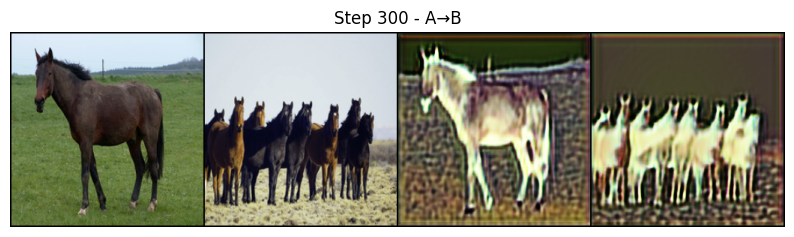

Epoch 1:  75%|███████▌  | 400/533 [03:26<01:09,  1.90it/s, D=0.487, G=6.630, x=0.393, kl=2.230] 

[+] Saved sample → samples\iter_400.jpg

[LPIPS@400] = 0.5285



Epoch 1:  94%|█████████▎| 499/533 [04:16<00:16,  2.00it/s, D=0.483, G=6.117, x=0.370, kl=5.704] 

[+] Saved sample → samples\iter_500.jpg


Epoch 1:  94%|█████████▍| 500/533 [04:16<00:21,  1.53it/s, D=0.483, G=6.117, x=0.370, kl=5.704]

[+] Checkpoint saved → checkpoints\munit_500.pth


Epoch 1: 100%|██████████| 533/533 [04:33<00:00,  1.95it/s, D=0.326, G=6.907, x=0.423, kl=2.446]



===== EPOCH 2/800 =====


Epoch 2:  12%|█▏        | 66/533 [00:33<03:53,  2.00it/s, D=0.502, G=6.522, x=0.336, kl=5.913]

[+] Saved sample → samples\iter_600.jpg


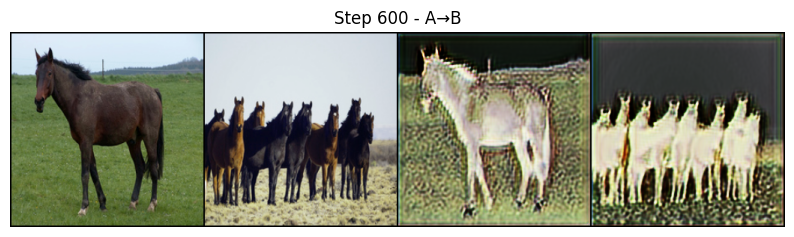

Epoch 2:  13%|█▎        | 67/533 [00:33<04:15,  1.82it/s, D=0.502, G=6.522, x=0.336, kl=5.913]


[LPIPS@600] = 0.5481



Epoch 2:  31%|███▏      | 167/533 [01:28<03:15,  1.87it/s, D=0.364, G=6.131, x=0.340, kl=2.253]

[+] Saved sample → samples\iter_700.jpg


Epoch 2:  50%|█████     | 267/533 [02:22<02:20,  1.89it/s, D=0.367, G=5.540, x=0.289, kl=3.605]

[+] Saved sample → samples\iter_800.jpg

[LPIPS@800] = 0.5939



Epoch 2:  69%|██████▊   | 366/533 [03:15<01:29,  1.87it/s, D=0.667, G=4.884, x=0.240, kl=4.143]

[+] Saved sample → samples\iter_900.jpg


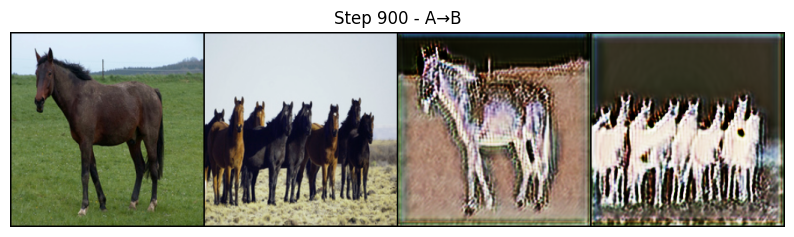

Epoch 2:  87%|████████▋ | 466/533 [04:08<00:35,  1.91it/s, D=0.264, G=6.096, x=0.321, kl=2.014]

[+] Saved sample → samples\iter_1000.jpg

[LPIPS@1000] = 0.5812



Epoch 2:  88%|████████▊ | 467/533 [04:09<00:45,  1.46it/s, D=0.264, G=6.096, x=0.321, kl=2.014]

[+] Checkpoint saved → checkpoints\munit_1000.pth


Epoch 2: 100%|██████████| 533/533 [04:45<00:00,  1.87it/s, D=0.366, G=4.711, x=0.225, kl=3.011]



===== EPOCH 3/800 =====


Epoch 3:   6%|▋         | 34/533 [00:18<04:37,  1.80it/s, D=0.313, G=5.721, x=0.311, kl=3.898]

[+] Saved sample → samples\iter_1100.jpg


Epoch 3:  25%|██▍       | 133/533 [01:11<03:26,  1.93it/s, D=0.511, G=4.520, x=0.223, kl=3.502]

[+] Saved sample → samples\iter_1200.jpg


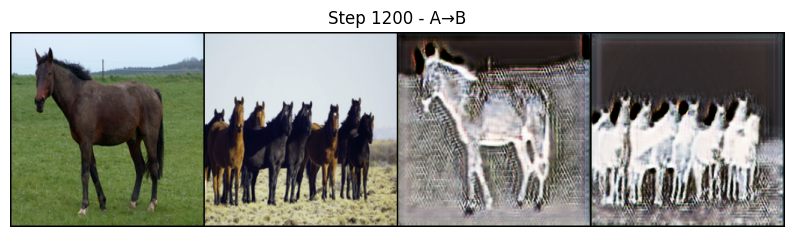

Epoch 3:  25%|██▌       | 134/533 [01:12<03:46,  1.76it/s, D=0.511, G=4.520, x=0.223, kl=3.502]


[LPIPS@1200] = 0.6096



Epoch 3:  44%|████▍     | 234/533 [02:05<02:39,  1.88it/s, D=0.352, G=5.018, x=0.251, kl=4.810]

[+] Saved sample → samples\iter_1300.jpg


Epoch 3:  63%|██████▎   | 334/533 [02:58<01:50,  1.81it/s, D=0.307, G=4.650, x=0.244, kl=3.607]

[+] Saved sample → samples\iter_1400.jpg

[LPIPS@1400] = 0.5804



Epoch 3:  81%|████████  | 433/533 [03:53<00:54,  1.84it/s, D=0.470, G=5.396, x=0.248, kl=4.186]

[+] Saved sample → samples\iter_1500.jpg


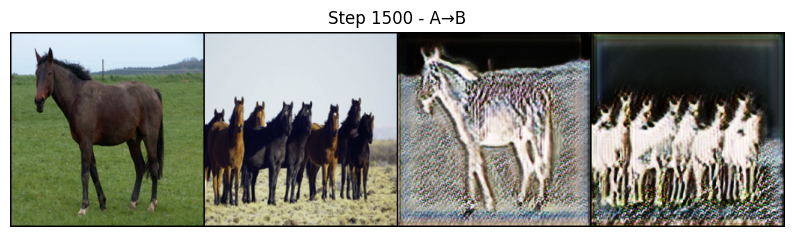

Epoch 3:  81%|████████▏ | 434/533 [03:53<01:12,  1.36it/s, D=0.470, G=5.396, x=0.248, kl=4.186]

[+] Checkpoint saved → checkpoints\munit_1500.pth


Epoch 3: 100%|██████████| 533/533 [04:47<00:00,  1.86it/s, D=0.407, G=4.760, x=0.223, kl=2.882]



===== EPOCH 4/800 =====


Epoch 4:   0%|          | 1/533 [00:00<05:38,  1.57it/s, D=0.345, G=4.875, x=0.223, kl=4.261]

[+] Saved sample → samples\iter_1600.jpg

[LPIPS@1600] = 0.5833



Epoch 4:  19%|█▉        | 101/533 [00:54<03:51,  1.86it/s, D=0.319, G=4.875, x=0.259, kl=3.635]

[+] Saved sample → samples\iter_1700.jpg


Epoch 4:  38%|███▊      | 200/533 [01:48<03:02,  1.83it/s, D=0.377, G=5.300, x=0.284, kl=4.468]

[+] Saved sample → samples\iter_1800.jpg


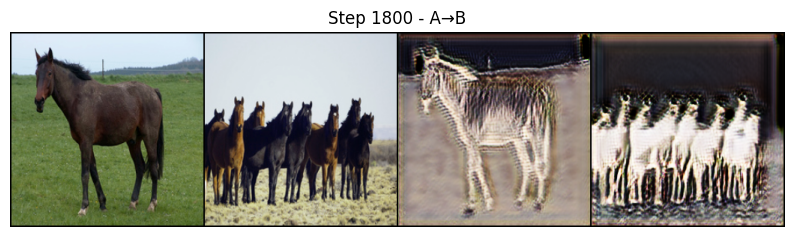

Epoch 4:  38%|███▊      | 201/533 [01:49<03:18,  1.67it/s, D=0.377, G=5.300, x=0.284, kl=4.468]


[LPIPS@1800] = 0.6062



Epoch 4:  56%|█████▋    | 301/533 [02:43<02:04,  1.87it/s, D=0.366, G=4.528, x=0.182, kl=3.267]

[+] Saved sample → samples\iter_1900.jpg


Epoch 4:  75%|███████▌  | 400/533 [03:36<01:09,  1.90it/s, D=0.314, G=5.443, x=0.280, kl=3.372]

[+] Saved sample → samples\iter_2000.jpg

[LPIPS@2000] = 0.6159



Epoch 4:  75%|███████▌  | 401/533 [03:36<01:31,  1.44it/s, D=0.314, G=5.443, x=0.280, kl=3.372]

[+] Checkpoint saved → checkpoints\munit_2000.pth


Epoch 4:  94%|█████████▍| 500/533 [04:32<00:18,  1.80it/s, D=0.315, G=4.890, x=0.205, kl=3.813]

[+] Saved sample → samples\iter_2100.jpg


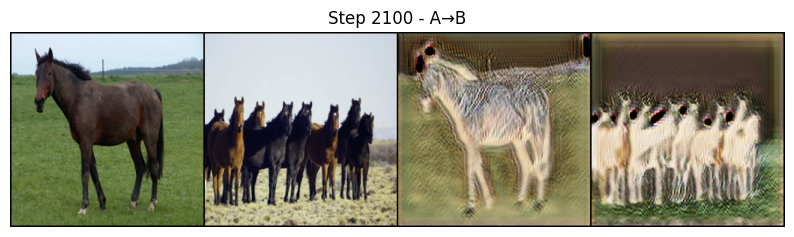

Epoch 4: 100%|██████████| 533/533 [04:49<00:00,  1.84it/s, D=0.468, G=4.328, x=0.179, kl=3.403]



===== EPOCH 5/800 =====


Epoch 5:  13%|█▎        | 68/533 [00:35<04:16,  1.81it/s, D=0.363, G=4.840, x=0.210, kl=3.280]

[+] Saved sample → samples\iter_2200.jpg

[LPIPS@2200] = 0.4882



Epoch 5:  32%|███▏      | 168/533 [01:28<03:15,  1.87it/s, D=0.426, G=4.589, x=0.234, kl=3.942]

[+] Saved sample → samples\iter_2300.jpg


Epoch 5:  50%|█████     | 267/533 [02:21<02:19,  1.91it/s, D=0.307, G=4.672, x=0.203, kl=3.342]

[+] Saved sample → samples\iter_2400.jpg


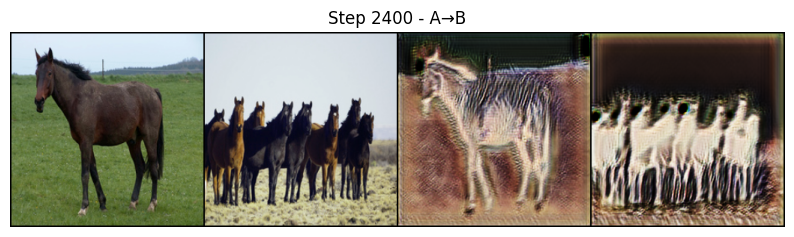

Epoch 5:  50%|█████     | 268/533 [02:21<02:32,  1.74it/s, D=0.307, G=4.672, x=0.203, kl=3.342]


[LPIPS@2400] = 0.5875



Epoch 5:  69%|██████▉   | 367/533 [03:13<01:26,  1.92it/s, D=0.351, G=4.467, x=0.213, kl=4.317]

[+] Saved sample → samples\iter_2500.jpg


Epoch 5:  69%|██████▉   | 368/533 [03:14<01:48,  1.52it/s, D=0.351, G=4.467, x=0.213, kl=4.317]

[+] Checkpoint saved → checkpoints\munit_2500.pth


Epoch 5:  88%|████████▊ | 468/533 [04:07<00:35,  1.81it/s, D=0.440, G=4.272, x=0.165, kl=3.235]

[+] Saved sample → samples\iter_2600.jpg

[LPIPS@2600] = 0.5641



Epoch 5: 100%|██████████| 533/533 [04:42<00:00,  1.89it/s, D=0.261, G=5.710, x=0.278, kl=5.428]



===== EPOCH 6/800 =====


Epoch 6:   6%|▋         | 34/533 [00:18<04:21,  1.91it/s, D=0.319, G=4.961, x=0.202, kl=3.922]

[+] Saved sample → samples\iter_2700.jpg


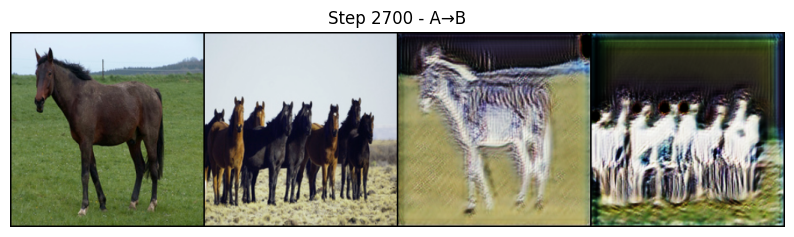

Epoch 6:  25%|██▌       | 135/533 [01:14<03:49,  1.73it/s, D=0.389, G=4.934, x=0.217, kl=3.784]

[+] Saved sample → samples\iter_2800.jpg

[LPIPS@2800] = 0.5730



Epoch 6:  44%|████▍     | 235/533 [02:09<02:46,  1.79it/s, D=0.311, G=3.669, x=0.155, kl=3.468]

[+] Saved sample → samples\iter_2900.jpg


Epoch 6:  63%|██████▎   | 334/533 [03:04<01:44,  1.91it/s, D=0.397, G=4.946, x=0.230, kl=5.507]

[+] Saved sample → samples\iter_3000.jpg


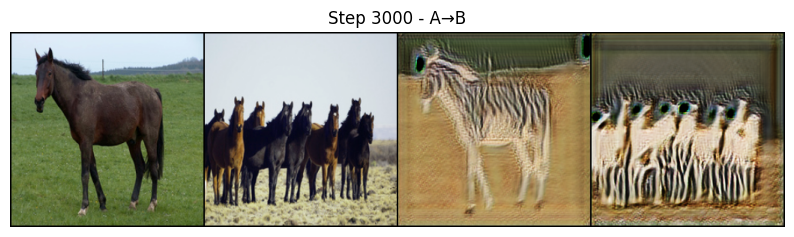


[LPIPS@3000] = 0.5903



Epoch 6:  63%|██████▎   | 335/533 [03:04<02:21,  1.40it/s, D=0.397, G=4.946, x=0.230, kl=5.507]

[+] Checkpoint saved → checkpoints\munit_3000.pth


Epoch 6:  82%|████████▏ | 435/533 [03:58<00:52,  1.86it/s, D=0.638, G=4.739, x=0.224, kl=4.167]

[+] Saved sample → samples\iter_3100.jpg


Epoch 6: 100%|██████████| 533/533 [04:51<00:00,  1.83it/s, D=0.318, G=4.324, x=0.166, kl=4.087]



===== EPOCH 7/800 =====


Epoch 7:   0%|          | 2/533 [00:01<05:22,  1.65it/s, D=0.418, G=4.087, x=0.175, kl=4.007]

[+] Saved sample → samples\iter_3200.jpg

[LPIPS@3200] = 0.6261



Epoch 7:  19%|█▉        | 101/533 [00:55<03:46,  1.91it/s, D=0.304, G=4.339, x=0.158, kl=4.289]

[+] Saved sample → samples\iter_3300.jpg


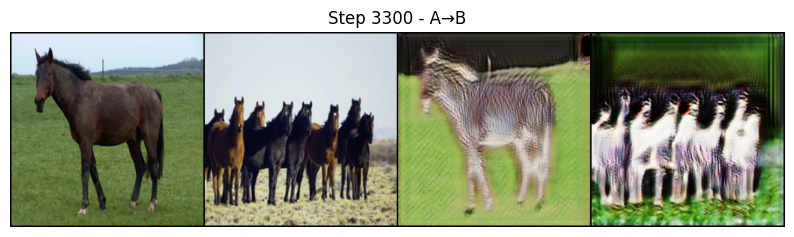

Epoch 7:  38%|███▊      | 202/533 [01:50<03:11,  1.73it/s, D=0.381, G=4.367, x=0.182, kl=3.940]

[+] Saved sample → samples\iter_3400.jpg

[LPIPS@3400] = 0.6112



Epoch 7:  56%|█████▋    | 301/533 [02:45<02:04,  1.86it/s, D=0.456, G=4.301, x=0.188, kl=4.197]

[+] Saved sample → samples\iter_3500.jpg


Epoch 7:  57%|█████▋    | 302/533 [02:46<02:34,  1.49it/s, D=0.456, G=4.301, x=0.188, kl=4.197]

[+] Checkpoint saved → checkpoints\munit_3500.pth


Epoch 7:  75%|███████▌  | 401/533 [03:39<01:09,  1.91it/s, D=0.299, G=4.287, x=0.178, kl=4.163]

[+] Saved sample → samples\iter_3600.jpg


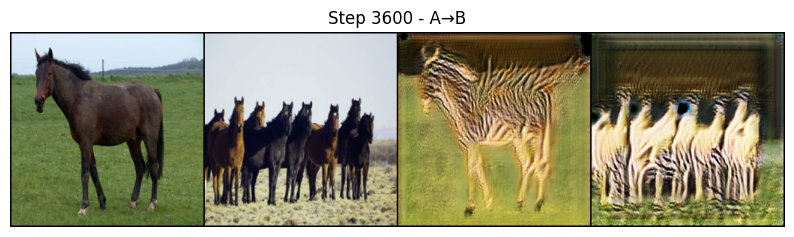

Epoch 7:  75%|███████▌  | 402/533 [03:39<01:15,  1.74it/s, D=0.299, G=4.287, x=0.178, kl=4.163]


[LPIPS@3600] = 0.6033



Epoch 7:  94%|█████████▍| 502/533 [04:32<00:16,  1.87it/s, D=0.272, G=4.594, x=0.187, kl=5.514]

[+] Saved sample → samples\iter_3700.jpg


Epoch 7: 100%|██████████| 533/533 [04:49<00:00,  1.84it/s, D=0.392, G=4.314, x=0.207, kl=5.264]



===== EPOCH 8/800 =====


Epoch 8:  13%|█▎        | 69/533 [00:36<04:16,  1.81it/s, D=0.646, G=3.521, x=0.125, kl=3.484]

[+] Saved sample → samples\iter_3800.jpg

[LPIPS@3800] = 0.6108



Epoch 8:  32%|███▏      | 168/533 [01:29<03:14,  1.88it/s, D=0.359, G=4.374, x=0.164, kl=3.536]

[+] Saved sample → samples\iter_3900.jpg


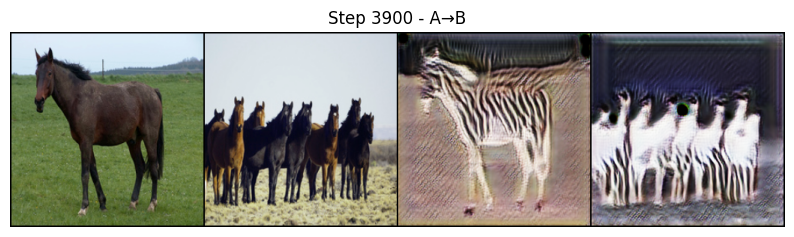

Epoch 8:  50%|█████     | 268/533 [02:24<02:19,  1.90it/s, D=0.369, G=4.471, x=0.203, kl=2.984]

[+] Saved sample → samples\iter_4000.jpg

[LPIPS@4000] = 0.6022



Epoch 8:  50%|█████     | 269/533 [02:25<03:03,  1.44it/s, D=0.369, G=4.471, x=0.203, kl=2.984]

[+] Checkpoint saved → checkpoints\munit_4000.pth


Epoch 8:  69%|██████▉   | 369/533 [03:18<01:28,  1.86it/s, D=0.313, G=4.452, x=0.172, kl=3.497]

[+] Saved sample → samples\iter_4100.jpg


Epoch 8:  88%|████████▊ | 468/533 [04:12<00:33,  1.91it/s, D=0.314, G=4.499, x=0.153, kl=4.795]

[+] Saved sample → samples\iter_4200.jpg


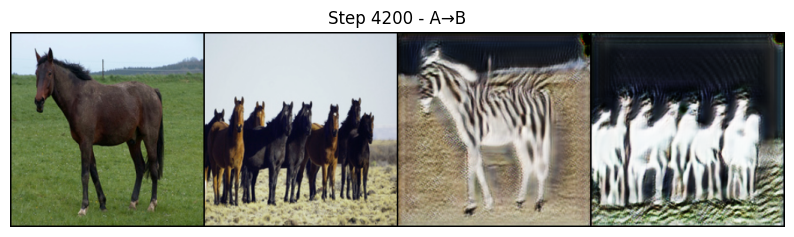

Epoch 8:  88%|████████▊ | 469/533 [04:12<00:36,  1.75it/s, D=0.314, G=4.499, x=0.153, kl=4.795]


[LPIPS@4200] = 0.5735



Epoch 8: 100%|██████████| 533/533 [04:47<00:00,  1.86it/s, D=0.371, G=3.671, x=0.166, kl=5.493]



===== EPOCH 9/800 =====


Epoch 9:   7%|▋         | 36/533 [00:19<04:26,  1.87it/s, D=0.474, G=4.067, x=0.177, kl=4.121]

[+] Saved sample → samples\iter_4300.jpg


Epoch 9:  26%|██▌       | 136/533 [01:11<03:38,  1.82it/s, D=0.309, G=3.796, x=0.156, kl=4.315]

[+] Saved sample → samples\iter_4400.jpg

[LPIPS@4400] = 0.5797



Epoch 9:  44%|████▍     | 235/533 [02:04<02:35,  1.91it/s, D=0.404, G=3.792, x=0.164, kl=3.422]

[+] Saved sample → samples\iter_4500.jpg


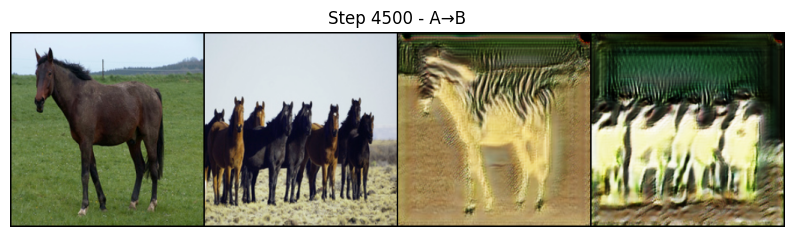

Epoch 9:  44%|████▍     | 236/533 [02:05<03:23,  1.46it/s, D=0.404, G=3.792, x=0.164, kl=3.422]

[+] Checkpoint saved → checkpoints\munit_4500.pth


Epoch 9:  63%|██████▎   | 336/533 [02:59<01:48,  1.82it/s, D=0.231, G=4.033, x=0.180, kl=5.142]

[+] Saved sample → samples\iter_4600.jpg

[LPIPS@4600] = 0.6208



Epoch 9:  82%|████████▏ | 436/533 [03:51<00:50,  1.90it/s, D=0.263, G=3.987, x=0.154, kl=4.985]

[+] Saved sample → samples\iter_4700.jpg


Epoch 9: 100%|██████████| 533/533 [04:41<00:00,  1.89it/s, D=0.255, G=4.599, x=0.210, kl=4.715]



===== EPOCH 10/800 =====


Epoch 10:   0%|          | 2/533 [00:01<04:39,  1.90it/s, D=0.418, G=4.448, x=0.197, kl=4.424]

[+] Saved sample → samples\iter_4800.jpg


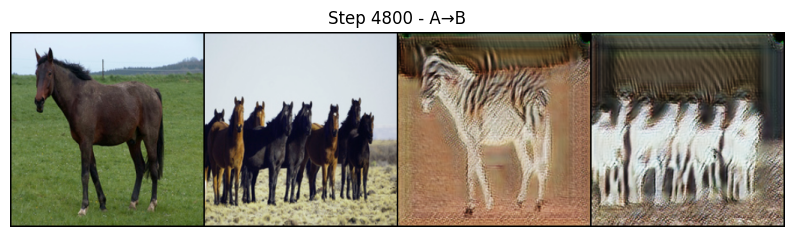

Epoch 10:   1%|          | 3/533 [00:01<05:19,  1.66it/s, D=0.418, G=4.448, x=0.197, kl=4.424]


[LPIPS@4800] = 0.6112



Epoch 10:  19%|█▉        | 103/533 [00:56<03:51,  1.86it/s, D=0.390, G=4.021, x=0.183, kl=3.874]

[+] Saved sample → samples\iter_4900.jpg


Epoch 10:  38%|███▊      | 202/533 [01:50<03:03,  1.81it/s, D=0.253, G=4.277, x=0.185, kl=4.886]

[+] Saved sample → samples\iter_5000.jpg

[LPIPS@5000] = 0.6278



Epoch 10:  38%|███▊      | 203/533 [01:50<03:53,  1.41it/s, D=0.253, G=4.277, x=0.185, kl=4.886]

[+] Checkpoint saved → checkpoints\munit_5000.pth


Epoch 10:  57%|█████▋    | 302/533 [02:41<01:54,  2.01it/s, D=0.471, G=4.478, x=0.198, kl=5.054]

[+] Saved sample → samples\iter_5100.jpg


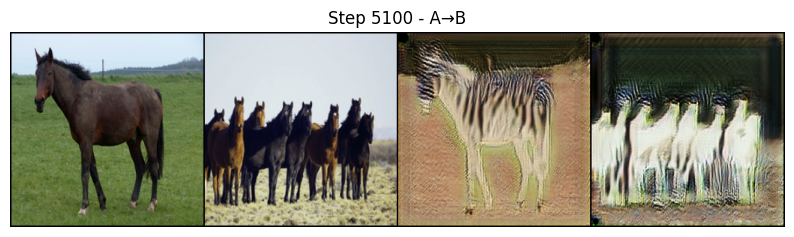

Epoch 10:  76%|███████▌  | 403/533 [03:32<01:13,  1.78it/s, D=0.312, G=3.811, x=0.156, kl=4.161]

[+] Saved sample → samples\iter_5200.jpg

[LPIPS@5200] = 0.6188



Epoch 10:  94%|█████████▍| 503/533 [04:27<00:16,  1.87it/s, D=0.575, G=3.637, x=0.142, kl=4.745]

[+] Saved sample → samples\iter_5300.jpg


Epoch 10: 100%|██████████| 533/533 [04:43<00:00,  1.88it/s, D=0.242, G=3.665, x=0.120, kl=3.604]



===== EPOCH 11/800 =====


Epoch 11:  13%|█▎        | 69/533 [00:38<04:11,  1.84it/s, D=0.332, G=4.250, x=0.155, kl=3.951]

[+] Saved sample → samples\iter_5400.jpg


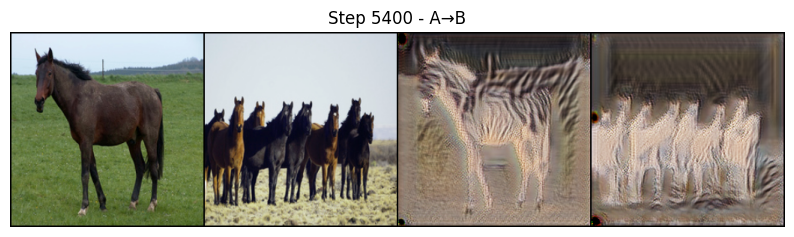

Epoch 11:  13%|█▎        | 70/533 [00:38<04:32,  1.70it/s, D=0.332, G=4.250, x=0.155, kl=3.951]


[LPIPS@5400] = 0.6610



Epoch 11:  32%|███▏      | 169/533 [01:32<03:09,  1.92it/s, D=0.386, G=3.869, x=0.135, kl=4.939]

[+] Saved sample → samples\iter_5500.jpg


Epoch 11:  32%|███▏      | 170/533 [01:33<04:00,  1.51it/s, D=0.386, G=3.869, x=0.135, kl=4.939]

[+] Checkpoint saved → checkpoints\munit_5500.pth


Epoch 11:  51%|█████     | 270/533 [02:26<02:24,  1.82it/s, D=0.397, G=3.786, x=0.143, kl=5.240]

[+] Saved sample → samples\iter_5600.jpg

[LPIPS@5600] = 0.5455



Epoch 11:  69%|██████▉   | 369/533 [03:19<01:26,  1.90it/s, D=0.254, G=4.528, x=0.196, kl=4.010]

[+] Saved sample → samples\iter_5700.jpg


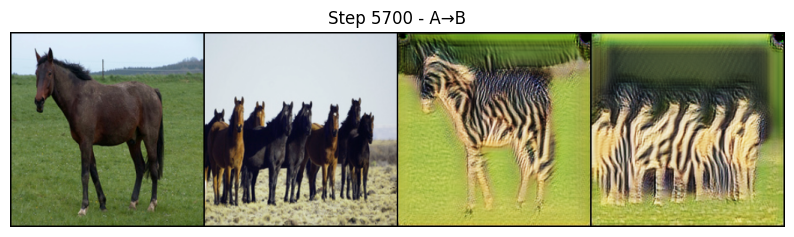

Epoch 11:  88%|████████▊ | 470/533 [04:13<00:34,  1.81it/s, D=0.286, G=4.701, x=0.204, kl=5.315]

[+] Saved sample → samples\iter_5800.jpg

[LPIPS@5800] = 0.6113



Epoch 11: 100%|██████████| 533/533 [04:47<00:00,  1.85it/s, D=0.352, G=3.954, x=0.168, kl=3.780]



===== EPOCH 12/800 =====


Epoch 12:   7%|▋         | 37/533 [00:19<04:24,  1.88it/s, D=0.344, G=3.714, x=0.151, kl=3.607]

[+] Saved sample → samples\iter_5900.jpg


Epoch 12:  26%|██▌       | 136/533 [01:13<03:27,  1.91it/s, D=0.319, G=4.137, x=0.179, kl=4.937]

[+] Saved sample → samples\iter_6000.jpg


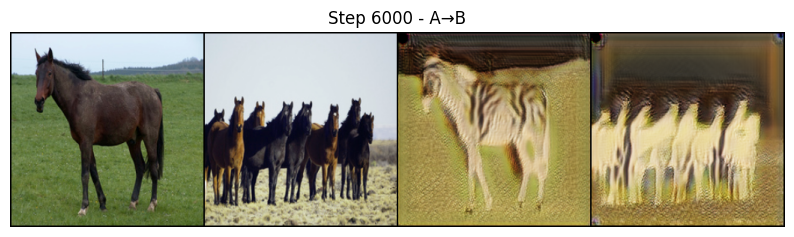


[LPIPS@6000] = 0.6008



Epoch 12:  26%|██▌       | 137/533 [01:13<04:37,  1.43it/s, D=0.319, G=4.137, x=0.179, kl=4.937]

[+] Checkpoint saved → checkpoints\munit_6000.pth


Epoch 12:  44%|████▍     | 237/533 [02:08<02:45,  1.79it/s, D=0.296, G=4.137, x=0.131, kl=4.999]

[+] Saved sample → samples\iter_6100.jpg


Epoch 12:  63%|██████▎   | 337/533 [03:01<01:47,  1.82it/s, D=0.337, G=3.867, x=0.167, kl=4.623]

[+] Saved sample → samples\iter_6200.jpg

[LPIPS@6200] = 0.6274



Epoch 12:  82%|████████▏ | 436/533 [03:55<00:50,  1.90it/s, D=0.319, G=4.212, x=0.163, kl=5.256]

[+] Saved sample → samples\iter_6300.jpg


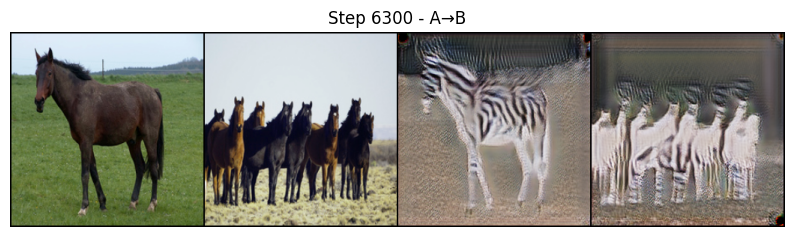

Epoch 12: 100%|██████████| 533/533 [04:46<00:00,  1.86it/s, D=0.414, G=4.513, x=0.163, kl=4.336]



===== EPOCH 13/800 =====


Epoch 13:   1%|          | 4/533 [00:02<05:10,  1.70it/s, D=0.295, G=3.645, x=0.147, kl=4.570]

[+] Saved sample → samples\iter_6400.jpg

[LPIPS@6400] = 0.6051



Epoch 13:  19%|█▉        | 103/533 [00:55<03:44,  1.91it/s, D=0.240, G=4.419, x=0.176, kl=5.780]

[+] Saved sample → samples\iter_6500.jpg


Epoch 13:  20%|█▉        | 104/533 [00:55<04:47,  1.49it/s, D=0.240, G=4.419, x=0.176, kl=5.780]

[+] Checkpoint saved → checkpoints\munit_6500.pth


Epoch 13:  38%|███▊      | 203/533 [01:49<02:54,  1.89it/s, D=0.429, G=4.221, x=0.194, kl=4.470]

[+] Saved sample → samples\iter_6600.jpg


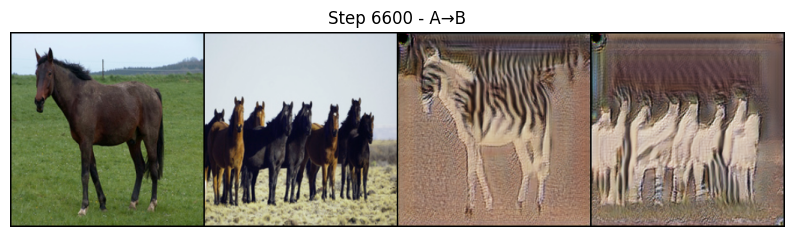

Epoch 13:  38%|███▊      | 204/533 [01:50<03:11,  1.72it/s, D=0.429, G=4.221, x=0.194, kl=4.470]


[LPIPS@6600] = 0.6051



Epoch 13:  57%|█████▋    | 304/533 [02:45<02:07,  1.79it/s, D=0.444, G=3.427, x=0.134, kl=4.851]

[+] Saved sample → samples\iter_6700.jpg


Epoch 13:  76%|███████▌  | 404/533 [03:39<01:11,  1.81it/s, D=0.363, G=3.857, x=0.164, kl=3.286]

[+] Saved sample → samples\iter_6800.jpg

[LPIPS@6800] = 0.6127



Epoch 13:  94%|█████████▍| 503/533 [04:32<00:15,  1.90it/s, D=0.476, G=4.051, x=0.179, kl=5.233]

[+] Saved sample → samples\iter_6900.jpg


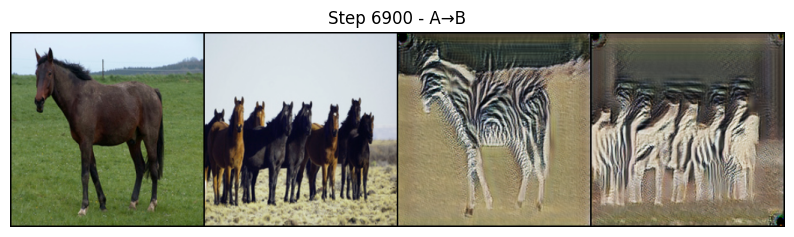

Epoch 13: 100%|██████████| 533/533 [04:48<00:00,  1.85it/s, D=0.412, G=3.777, x=0.183, kl=4.286]



===== EPOCH 14/800 =====


Epoch 14:  13%|█▎        | 70/533 [00:37<04:03,  1.90it/s, D=0.237, G=3.952, x=0.140, kl=4.669]

[+] Saved sample → samples\iter_7000.jpg

[LPIPS@7000] = 0.6111



Epoch 14:  13%|█▎        | 71/533 [00:38<05:16,  1.46it/s, D=0.237, G=3.952, x=0.140, kl=4.669]

[+] Checkpoint saved → checkpoints\munit_7000.pth


Epoch 14:  32%|███▏      | 171/533 [01:31<03:15,  1.86it/s, D=0.372, G=3.541, x=0.144, kl=4.357]

[+] Saved sample → samples\iter_7100.jpg


Epoch 14:  51%|█████     | 270/533 [02:26<02:18,  1.90it/s, D=0.533, G=3.842, x=0.152, kl=5.464]

[+] Saved sample → samples\iter_7200.jpg


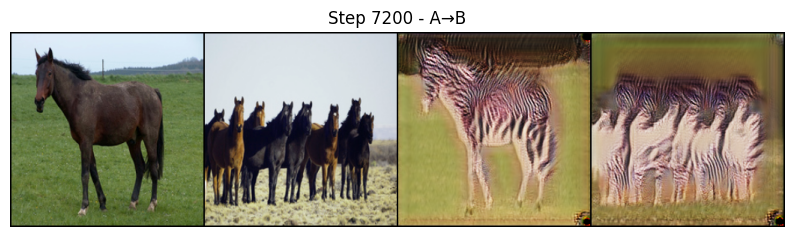

Epoch 14:  51%|█████     | 271/533 [02:26<02:30,  1.74it/s, D=0.533, G=3.842, x=0.152, kl=5.464]


[LPIPS@7200] = 0.6136



Epoch 14:  70%|██████▉   | 371/533 [03:19<01:27,  1.85it/s, D=0.382, G=3.867, x=0.141, kl=4.827]

[+] Saved sample → samples\iter_7300.jpg


Epoch 14:  88%|████████▊ | 471/533 [04:13<00:34,  1.80it/s, D=0.440, G=4.199, x=0.196, kl=5.563]

[+] Saved sample → samples\iter_7400.jpg

[LPIPS@7400] = 0.5656



Epoch 14: 100%|██████████| 533/533 [04:46<00:00,  1.86it/s, D=0.307, G=3.582, x=0.125, kl=4.004]



===== EPOCH 15/800 =====


Epoch 15:   7%|▋         | 37/533 [00:20<04:19,  1.91it/s, D=0.214, G=4.075, x=0.165, kl=5.133]

[+] Saved sample → samples\iter_7500.jpg


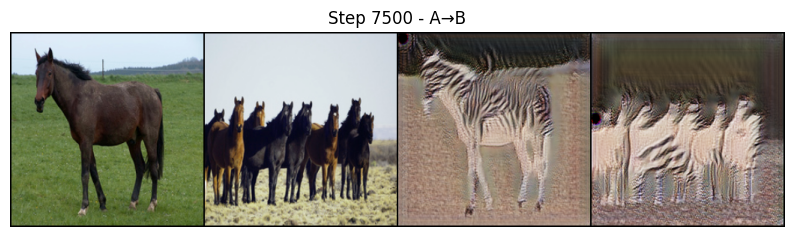

Epoch 15:   7%|▋         | 38/533 [00:20<05:45,  1.43it/s, D=0.214, G=4.075, x=0.165, kl=5.133]

[+] Checkpoint saved → checkpoints\munit_7500.pth


Epoch 15:  26%|██▌       | 138/533 [01:13<03:36,  1.82it/s, D=0.426, G=3.549, x=0.137, kl=4.298]

[+] Saved sample → samples\iter_7600.jpg

[LPIPS@7600] = 0.6530



Epoch 15:  45%|████▍     | 238/533 [02:07<02:41,  1.82it/s, D=0.318, G=4.293, x=0.194, kl=3.912]

[+] Saved sample → samples\iter_7700.jpg


Epoch 15:  63%|██████▎   | 337/533 [03:02<01:47,  1.82it/s, D=0.325, G=3.493, x=0.143, kl=3.990]

[+] Saved sample → samples\iter_7800.jpg


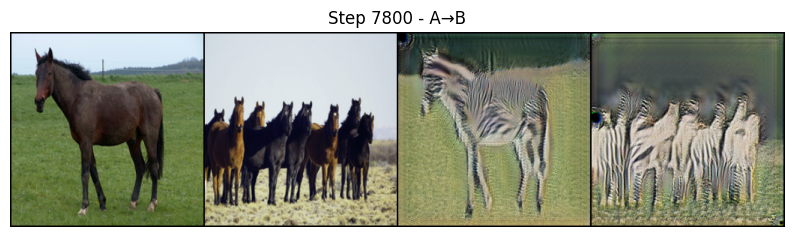

Epoch 15:  63%|██████▎   | 338/533 [03:02<01:56,  1.68it/s, D=0.325, G=3.493, x=0.143, kl=3.990]


[LPIPS@7800] = 0.5897



Epoch 15:  82%|████████▏ | 438/533 [03:56<00:51,  1.86it/s, D=0.315, G=4.189, x=0.182, kl=5.589]

[+] Saved sample → samples\iter_7900.jpg


Epoch 15: 100%|██████████| 533/533 [04:47<00:00,  1.85it/s, D=0.262, G=4.180, x=0.148, kl=3.211]



===== EPOCH 16/800 =====


Epoch 16:   1%|          | 4/533 [00:03<05:27,  1.62it/s, D=0.449, G=3.488, x=0.135, kl=3.536]

[+] Saved sample → samples\iter_8000.jpg

[LPIPS@8000] = 0.6137



Epoch 16:   1%|          | 5/533 [00:03<07:09,  1.23it/s, D=0.449, G=3.488, x=0.135, kl=3.536]

[+] Checkpoint saved → checkpoints\munit_8000.pth


Epoch 16:  20%|█▉        | 104/533 [00:58<03:42,  1.93it/s, D=0.420, G=4.349, x=0.154, kl=4.478]

[+] Saved sample → samples\iter_8100.jpg


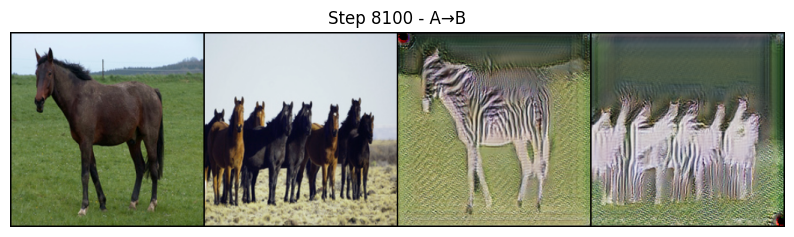

Epoch 16:  38%|███▊      | 205/533 [01:52<03:02,  1.80it/s, D=0.198, G=3.804, x=0.130, kl=5.442]

[+] Saved sample → samples\iter_8200.jpg

[LPIPS@8200] = 0.5515



Epoch 16:  57%|█████▋    | 305/533 [02:46<02:07,  1.79it/s, D=0.337, G=4.403, x=0.198, kl=4.975]

[+] Saved sample → samples\iter_8300.jpg


Epoch 16:  61%|██████    | 323/533 [02:55<01:55,  1.81it/s, D=0.349, G=3.827, x=0.159, kl=4.498]

In [ ]:
model = train_example(
    data_root_A="data/horse",
    data_root_B="data/zebra",
    epochs=800,          # можно большое число
    batch_size=2,
    max_hours=2.0,        # остановится по таймеру
    save_every=500,       # период чекпоинтов
    resume_path=None,     # указать путь к .pth, чтобы продолжить
)

In [ ]:
model = train_example(..., resume_path="checkpoints/munit_timelimit_xxx.pth")

In [ ]:
# Example: set two folders with a few images each: data/domain1, data/domain2
dataA = "data/domain1"
dataB = "data/domain2"
train_example(dataA, dataB, epochs=2, batch_size=1, device='cuda')